## Twitter Network Analysis of the California Camp Fire
**Alex John Quijano$^{*}$, Maia Powell$^{*}$, Matthew Mondares$^{+}$** <br />
*$^{*}$University of California Merced, Applied Mathematics* <br />
*$^{+}$University of California Merced, Management and Complex Systems*

**This is a project documentation for the Global Good Studio, COGS-269, University of California Merced.**

In [20]:
# import required modules
import os
import numpy as np
import pandas as pd
import networkx as nx
import matplotlib
font = {'size': 20}
matplotlib.rc('font',**font)
import matplotlib.pyplot as plt
from matplotlib import cm
import myUtilities as mu
try:
    os.mkdir('figures')
except:
    pass
import plotly
import plotly.graph_objects as go
import math

### 1. Dataset.

The data is scraped using a scraper provided by the Github user <a href ="https://github.com/jonbakerfish/TweetScraper">jonbakerfish</a> and it was processed by Github user <a href="https://github.com/stressosaurus/raw-data-twitter-tweets-scrape">stressosaurus</a>. The scraper scraped a set of tweets in November 2018 and November 2019 using a set of general keywords listed below. To get more tweets related to the tweets scraped using the below keywords, a second scraping task is performed using the Twitter API. In this scraping method, twitter information such as the parent tweet - if the tweet is a reply - is retrieved. A depth-first search algorithm is applied to the scraper to retrieve these tweets. 

**General Keywords - Fire related**
```
bushfire
bushfires
conflagration
conflagrations
arson
arsons
smolder
smolders
smoldered
firebreak
firebreaks
blaze
blazed
burn
burns
burned
firestorm
firestorms
campfire
campfires
flame
flames
flamed
bonfire
bonfires
heat
heats
heated
flare
flares
flared
```

To further get the tweets related to the California campfire, data subsetting is performed using the following keywords. All related tweets are also included to the subset. Related tweets includes tweets with replies, the replies, and any cooccurring hashtags.

```
#campfire
#campfires
#buttecounty
#chico
#campfirepets
#paradise
#bushfires
#magalia
#campfireparadise
#buttestrong
#climatechange
#woolseyfire
#paradisestrong
#campfirejameswoods
#oroville
#paradiseca
#concow
#californiafires
#buttecountyfires
#cafires
#paradisefires
#cawx
#californiastrong
#californiawildfires
#buttecountystrong
#californiastrong
#wildfire
#wildfires
#hillfire
#hillfires
#disasterassistteam
#bushfire
#bushfires
bushfire
bushfires
wildfire
wildfires
campfire
campfires
```

In the next subsection, we describe the data structures of the scraped tweets.

#### 1.1. Load Datasets.

The below two blocks of code opens two sets of data. First the tweets data stored in "T" variables and the user data stored in the "U" variable.

In [21]:
# twitter information
T = pd.DataFrame(np.load('data-subset/CAF-words-fire-related-words-tweets.npy',
                         allow_pickle=True).item())
# examples
print('This shows two examples from the data.')
print()
T.head(2)

This shows two examples from the data.



,day,favorite_count,hashtags,hour,language,minute,month,parent_tweet_id,quoted_tweet_id,retweet_count,second,text,time_zone,urls,user_id,user_screen_name,usermentions,with_image,year
1067752277266464770,28,15,"#LNG,#fires,#flaring,#Gas,#qldpol",12,en,9,11,*,*,24,15,Are #LNG plants safe from the regions #fires? ...,+0000,*,4031994734,[W-USN6880],"[W-USN133],[W-USN6881],[W-USN5432]",True,2018
1068026533883740160,29,3,*,6,en,19,11,1067942509639163904,1068025742942863360,0,3,Large parts of Queensland remain under siege t...,+0000,https://twitter.com/7NewsBrisbane/status/10680...,74382140,[W-USN4724],*,False,2018


In [22]:
# user information 
# user Twitter handles are patched and you need the user file to get the actual user handle
# uncomment the following lines
# U = np.load('data-subset/CAF-words-fire-related-words-users.npy',
#            allow_pickle=True).item()

# examples
print('This shows an example of a user information and the associated key in the data.')
print()
print(U['key']['Alyssa_Milano'])
print(U['key']['[W-USN1783]'])
print(U['information']['Alyssa_Milano'])

This shows an example of a user information and the associated key in the data.

[W-USN1783]
Alyssa_Milano
{'user_id': 26642006, 'year': 2009, 'month': 3, 'day': 26, 'hour': 0, 'minute': 34, 'second': 20, 'user_number_of_followers': 3686733, 'user_location': 'Los Angeles', 'patch': '[W-USN1783]'}


#### 1.2. Load Networks.

##### 1.2.1. Defining the User Cooccurrence (or User-User) Network.
The user-user network is an undirected network, showing interactions between users via @ mentions and replies. Consequently, each node represents a single Twitter user and each edge is an interaction.

<img src="figures/user-user-2.png" width=300>

##### 1.2.2. Defining the Hashtag Cooccurrence Network.
The hashtag coccurence network is an undirected network. In other words, if a tweet contains two hashtags $a$ and $b$, then they coccur. Therefore, the nodes represent individual hashtags and the edges represent their coccurence.

<img src="figures/hashtag-2.png" width=300>

The following code block opens the networks for the user cooccurrence and the hashtag cooccurence for November 2018 and November 2019. The resulting networks have multiple components or subnetworks. That is each component is a connected subnetwork within the overall network; components are disconnected.

In [23]:
# full networks - networkx data structure
USN_G_112018 = nx.read_gpickle('data-networks/USN-nx-112018.gpickle')
HTGS_G_112018 = nx.read_gpickle('data-networks/HTGS-nx-112018.gpickle')
USN_G_112019 = nx.read_gpickle('data-networks/USN-nx-112019.gpickle')
HTGS_G_112019 = nx.read_gpickle('data-networks/HTGS-nx-112019.gpickle')

# full network in components - networkx data structure
USN_G_112018_C = nx.read_gpickle('data-networks/USN-nx-112018-comps.gpickle')
HTGS_G_112018_C = nx.read_gpickle('data-networks/HTGS-nx-112018-comps.gpickle')
USN_G_112019_C = nx.read_gpickle('data-networks/USN-nx-112019-comps.gpickle')
HTGS_G_112019_C = nx.read_gpickle('data-networks/HTGS-nx-112019-comps.gpickle')

#### 2. User Bot Values.

The users are classified using the Botometer model by <a href="https://osome.iuni.iu.edu/">OSoMe</a> with Github repository <a href="https://github.com/IUNetSci/botometer-python">botometer</a>. The botometer uses a twitter API to compute a number that tells us if a user is a bot or not. In this project, we use the display scores and the complete automation probability, the probability that a user's tweets are automated. The displays scores are ranged from $0$ to $5$ where $5$ means a user is more likely a bot while $0$ means a user is less likely a bot. To assign one value for each user, we compute the bot score which is the linear combination of the two scores that is given by

$$b = 5 \frac{1}{2} \text{(complete automation probability)} + \frac{1}{2} \text{(display score)}$$

where the resulting bot score is a continuous number from $1$ to $5$. To separate the bot scores into $5$ discrete categories, we use the function below and call it the bot value.

$$
f(\text{b})=
\begin{cases}
1 \hspace{10px}\text{ if }\hspace{10px} 0 \le b < 1 \text{ (user is not a bot) } \\
2 \hspace{10px}\text{ if }\hspace{10px} 1 \le b < 2 \\
3 \hspace{10px}\text{ if }\hspace{10px} 2 \le b < 3 \\
4 \hspace{10px}\text{ if }\hspace{10px} 3 \le b < 4 \\
5 \hspace{10px}\text{ if }\hspace{10px} 4 \le b \le 5 \text{ (user is a bot) }\\
\end{cases}.
$$

#### 3. Centrality Measures.

##### 2.1. The Eigenvector Centrality [CITATION].

Eigenvector centrality provides a metric for influence. A node is important, or more influential, if it is connected to other important nodes.

*Definition.* Let $A = (a_{i,j})$ be the adjacency matrix of a graph, where $a_{i,j} = 1$ if nodes $i$ and $j$ are connected, and $a_{i,j} = 0$ elsewhere. We then compute the eigenvalues $\lambda_1, \lambda_2, \cdots, \lambda_i$ of $A$, select $\max_{i} |\lambda_i| = \lambda_{max}$, and find its corresponding eigenvector $\vec{x}_{\lambda_{max}}$. The eigenvector centrality of a node $i$ is thus the $i^{th}$ component of $\vec{x}_{\lambda_{max}}$.

##### 2.2. The Betweenness Centrality [CITATION].

Betweenness centrality measures the extent to which a vertex lies on paths between other vertices. High betweeness of a node then implies it has influence over other nodes as a result of its control over the transmission of information throughout the network. 

*Definition.* The betweeness centrality $\beta$ of a node $a$ is
$$\beta(a) = \sum_{a \neq b \neq c} \frac{\sigma_{bc}(a)}{\sigma_{bc}}$$
where $\sigma_{bc}$ denotes the total number of geodesic paths between nodes $b$ and $c$ and $\sigma_{bc}(a)$ denotes the number of those paths between that contain $a$.

#### 3. Visualizing the Networks.

##### 3.1. November 2018 User Co-occurrence (User-User) Network.

C:\Users\ajavq\Anaconda3\lib\site-packages\ipykernel_launcher.py:52: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 



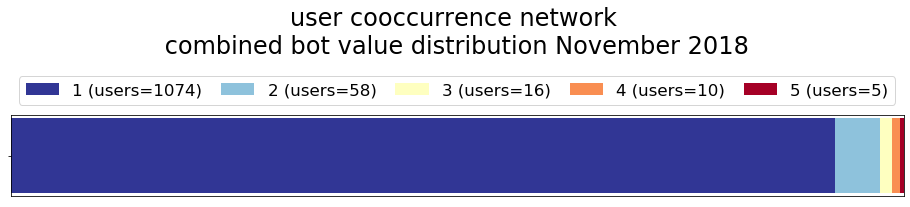

In [24]:
# User Bot Distribution
B5CAT_vect = []
colormap_seismic = cm.get_cmap('RdYlBu')
B5CAT_color = list(reversed([colormap_seismic(i) for i in np.linspace(0,1,5)]))
for i in USN_G_112018.nodes():
    B5CAT_vect.append(USN_G_112018.nodes[i]['bot_5cat'])
u, c = np.unique(B5CAT_vect,return_counts=True)
c_results = {'':c}

def survey(results, category_names):
    """
    Parameters
    ----------
    results : dict
        A mapping from question labels to a list of answers per category.
        It is assumed all lists contain the same number of entries and that
        it matches the length of *category_names*.
    category_names : list of str
        The category labels.
    """
    labels = list(results.keys())
    data = np.array(list(results.values()))
    data_cum = data.cumsum(axis=1)
    category_colors = plt.get_cmap('RdYlGn')(
        np.linspace(0.15, 0.85, data.shape[1]))

    fig, ax = plt.subplots(figsize=(16, 1.5))
    ax.invert_yaxis()
    ax.xaxis.set_visible(False)
    ax.set_xlim(0, np.sum(data, axis=1).max())

    for i, (colname, color) in enumerate(zip(category_names, B5CAT_color)):
        widths = data[:, i]
        starts = data_cum[:, i] - widths
        
        ax.barh(labels, widths, left=starts, height=0.5,
                label=str(colname)+' (users='+str(int(widths[0]))+')', color=color)
        xcenters = starts + widths / 2

        r, g, b, _ = color
        text_color = 'white' if r * g * b < 0.5 else 'darkgrey'
        for y, (x, c) in enumerate(zip(xcenters, widths)):
            ax.text(x, y,'', ha='center', va='center',
                    color=text_color)
    ax.legend(bbox_to_anchor=(0, 1.02,1,.102),
              loc=3, fontsize="small",mode='expand',ncol=5)

    return fig, ax

fig, ax = survey(c_results, u)
ax.set_title('user cooccurrence network \n combined bot value distribution November 2018 \n\n')
plt.tight_layout()
plt.savefig('figures/USN-combinedBotValueDistribution-112018.png')
plt.show()

In [25]:
# users cooccurrence frequency distributions
freq_vect = {'component':[],'edge':[],'frequency':[]}
for j, i in enumerate(USN_G_112018_C):
    for k in i.edges():
        freq_vect['component'].append(j)
        freq_vect['edge'].append(k)
        freq_vect['frequency'].append(i.edges[k]['frequency'])
freq_vect = pd.DataFrame(freq_vect).set_index('edge').sort_values(by='frequency',ascending=False)

# list top hashtag frequency values
print('Top edges in November 2018')
print(freq_vect.head(20))

Top edges in November 2018
                             component  frequency
edge                                             
([W-USN2571], [W-USN2553])           0         51
([W-USN2561], [W-USN2553])           0         48
([W-USN2561], [W-USN2571])           0         48
([W-USN2561], [W-USN2593])           0         48
([W-USN2553], [W-USN2593])           0         48
([W-USN2571], [W-USN2593])           0         48
([W-USN2571], [W-USN6665])           0         32
([W-USN2571], [W-USN6674])           0         30
([W-USN2553], [W-USN6674])           0         30
([W-USN4148], [W-USN1948])           0         30
([W-USN23108], [W-USN1948])          0         30
([W-USN2571], [W-USN2558])           0         29
([W-USN6658], [W-USN2571])           0         28
([W-USN6658], [W-USN2553])           0         28
([W-USN4148], [W-USN23108])          0         28
([W-USN6658], [W-USN6674])           0         28
([W-USN6649], [W-USN6658])           0         27
([W-USN2593], [W-USN667

In [26]:
# user centralities distributions
centrality_vect = {'component':[],'user':[],'eig':[],'bet':[],'deg':[]}
for j, i in enumerate(USN_G_112018_C):
    for k in i.nodes():
        centrality_vect['component'].append(j)
        centrality_vect['user'].append(k)
        centrality_vect['eig'].append(i.nodes[k]['centrality'])
        centrality_vect['bet'].append(i.nodes[k]['betweenness'])
        centrality_vect['deg'].append(i.nodes[k]['degree'])
centrality_vect = pd.DataFrame(centrality_vect).set_index('user')

# list top eigenvector centrality values
print('Top user eigenvector centralities in November 2018 by component')
centrality_vect = centrality_vect.sort_values(by='eig',ascending=False)
print(centrality_vect.head(20))
print()
print('Top user betweenness centralities in November 2018 by component')
centrality_vect = centrality_vect.sort_values(by='bet',ascending=False)
print(centrality_vect.head(20))
print()
print('Top user degree centralities in November 2018 by component')
centrality_vect = centrality_vect.sort_values(by='deg',ascending=False)
print(centrality_vect.head(20))

Top user eigenvector centralities in November 2018 by component
             component       eig       bet       deg
user                                                
[W-USN2558]          0  0.171419  0.001548  0.081756
[W-USN2555]          0  0.171419  0.001548  0.081756
[W-USN2557]          0  0.171419  0.001548  0.081756
[W-USN2559]          0  0.171419  0.001548  0.081756
[W-USN2553]          0  0.171419  0.001548  0.081756
[W-USN2571]          0  0.171419  0.001548  0.081756
[W-USN2561]          0  0.107255  0.000174  0.049053
[W-USN2593]          0  0.107255  0.000174  0.049053
[W-USN6665]          0  0.102231  0.000024  0.046472
[W-USN6648]          0  0.102231  0.000024  0.046472
[W-USN6667]          0  0.100447  0.000018  0.045611
[W-USN6649]          0  0.098728  0.000009  0.044750
[W-USN6674]          0  0.098728  0.000009  0.044750
[W-USN6650]          0  0.098728  0.000009  0.044750
[W-USN6658]          0  0.098728  0.000009  0.044750
[W-USN2570]          0  0.098442  0

In [27]:
G = USN_G_112018
pos = nx.spring_layout(G) # obtain positions for each node in the network 

### Interactive plot
edge_x = []
edge_y = []
for edge in G.edges():
    x0,y0 = pos[edge[0]]
    x1,y1 = pos[edge[1]]
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)

# Creating a "scatter plot" of the edges
edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.75, color='slategray'), # change the thickness and color of the edges
    hoverinfo='none',
    opacity = 0.5,
    mode='lines',
    showlegend=False)

# Creating the nodes, based on positions
node_x = []
node_y = []
for node in G.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)

# Creating a scatter plot of the nodes
node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    marker=dict(
        #showscale=True,
        # colorscale options
        #'Greys' | 'YlGnBu' | 'Greens' | 'YlOrRd' | 'Bluered' | 'RdBu' |
        #'Reds' | 'Blues' | 'Picnic' | 'Rainbow' | 'Portland' | 'Jet' |
        #'Hot' | 'Blackbody' | 'Earth' | 'Electric' | 'Viridis' |
        #colorscale='RdYlBu',m
        colorscale = [[0,'rgb(42,35,160)'], [0.25,'rgb(29,145,192)'], [0.5,'rgb(254,227,145)'], [0.75,'rgb(241,105,19)'], [1.0, 'rgb(227,26,28)']],
        line_width=0.5),
        showlegend=False)

node_5bot = []
node_text_5bot = []
for node in G.nodes():
    node_5bot.append(G.nodes[node]['bot_5cat'])
    node_text_5bot.append('Bot Score: '+str(G.nodes[node]['bot_5cat']))
count1, count2 = np.unique(node_5bot, return_counts=True)

node_eig = []
node_text_eig = []
node_b = []
for node in G.nodes():
    node_eig.append(round(G.nodes[node]['centrality'],4))
    node_b.append(round(G.nodes[node]['betweenness'],4))
    node_text_eig.append('User: '+str(node)+', Influence: '
                         +str(round(G.nodes[node]['centrality'],4))
                         +', Betweenness: '+str(round(G.nodes[node]['betweenness'],4))
                         +', Degree: '+str(round(G.nodes[node]['degree'],4)))

node_trace.marker.color = node_5bot
node_eig3 = [10 + i*100 for i in node_eig]
node_trace.marker.size = node_eig3
node_trace.text = node_text_eig

text = 'Plot of the largest connected subnetwork, <br>\
        displaying values of Bot Score (color of node), <br>\
        eigenvector centality (proportional to the size of node), <br>\
        betweeness centrality (hover mouse), <br>\
        and degree centrality (hover mouse).'

#Creating the figure 
fig = go.Figure(data = [edge_trace, node_trace],
             layout=go.Layout(
                title='User Network (November 2018)',
                titlefont_size=24,
                showlegend=True,
                plot_bgcolor = 'rgb(224,243,219)',
                hovermode='closest',
                margin=dict(b=20,l=5,r=5,t=40),
                annotations=[ dict(
                    text=text,
                    showarrow=False,
                    xref="paper", yref="paper",
                    align="left",
                    x=0.005, y=-0.002 ) ],
                xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )

fig.add_trace(go.Scatter(
    x=[0.005],
    y=[-0.002],
    #visible = False,
    showlegend=True,
    mode='markers',
    marker = dict(color = 'rgb(42,35,160)', size =0.1),
    name="1"       # this sets its legend entry
))


fig.add_trace(go.Scatter(
    x=[0.005],
    y=[-0.002],
    #visible = False,
    showlegend=True,
    mode='markers',
    marker = dict(color = 'rgb(29,145,192)', size =0.1),
    name="2"
))

fig.add_trace(go.Scatter(
    x=[0.005],
    y=[-0.002],
    #visible = False,
    showlegend=True,
    mode='markers',
    marker = dict(color = 'rgb(254,227,145)', size =0.1),
    name="3"
))

fig.add_trace(go.Scatter(
    x=[0.005],
    y=[-0.002],
    #visible = False,
    showlegend=True,
    mode='markers',
    marker = dict(color = 'rgb(241,105,19)', size =0.1),
    name="4"
))

fig.add_trace(go.Scatter(
    x=[0.005],
    y=[-0.002],
    #visible = False,
    showlegend=True,
    mode='markers',
    marker = dict(color = 'rgb(227,26,28)', size =0.1),
    name="5"
))

fig.update_layout(legend= dict(itemsizing='constant', itemclick='toggleothers', bgcolor='rgb(224,243,219)'))


fig.update_layout(legend_title='<b> Bot Score </b>')

fig.show()

plotly.offline.plot(fig, filename = 'figures/USN-network-112018-patched.html', auto_open=False)

'figures/USN-network-112018-patched.html'

##### 3.2. November 2019 User Co-occurrence (User) Network.

C:\Users\ajavq\Anaconda3\lib\site-packages\ipykernel_launcher.py:52: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 



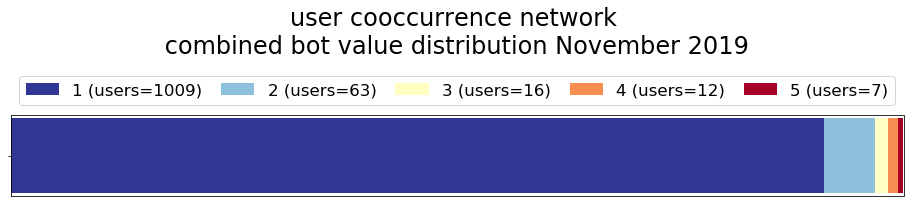

In [28]:
# User Bot Distribution
B5CAT_vect = []
colormap_seismic = cm.get_cmap('RdYlBu')
B5CAT_color = list(reversed([colormap_seismic(i) for i in np.linspace(0,1,5)]))
for i in USN_G_112019.nodes():
    B5CAT_vect.append(USN_G_112019.nodes[i]['bot_5cat'])
u, c = np.unique(B5CAT_vect,return_counts=True)
c_results = {'':c}

def survey(results, category_names):
    """
    Parameters
    ----------
    results : dict
        A mapping from question labels to a list of answers per category.
        It is assumed all lists contain the same number of entries and that
        it matches the length of *category_names*.
    category_names : list of str
        The category labels.
    """
    labels = list(results.keys())
    data = np.array(list(results.values()))
    data_cum = data.cumsum(axis=1)
    category_colors = plt.get_cmap('RdYlGn')(
        np.linspace(0.15, 0.85, data.shape[1]))

    fig, ax = plt.subplots(figsize=(16, 1.5))
    ax.invert_yaxis()
    ax.xaxis.set_visible(False)
    ax.set_xlim(0, np.sum(data, axis=1).max())

    for i, (colname, color) in enumerate(zip(category_names, B5CAT_color)):
        widths = data[:, i]
        starts = data_cum[:, i] - widths
        
        ax.barh(labels, widths, left=starts, height=0.5,
                label=str(colname)+' (users='+str(int(widths[0]))+')', color=color)
        xcenters = starts + widths / 2

        r, g, b, _ = color
        text_color = 'white' if r * g * b < 0.5 else 'darkgrey'
        for y, (x, c) in enumerate(zip(xcenters, widths)):
            ax.text(x, y,'', ha='center', va='center',
                    color=text_color)
    ax.legend(bbox_to_anchor=(0, 1.02,1,.102),
              loc=3, fontsize="small",mode='expand',ncol=5)

    return fig, ax

fig, ax = survey(c_results, u)
ax.set_title('user cooccurrence network \n combined bot value distribution November 2019 \n\n')
plt.tight_layout()
plt.savefig('figures/USN-combinedBotValueDistribution-112019.png')
plt.show()

In [29]:
# users cooccurrence frequency distributions
freq_vect = {'component':[],'edge':[],'frequency':[]}
for j, i in enumerate(USN_G_112019_C):
    for k in i.edges():
        freq_vect['component'].append(j)
        freq_vect['edge'].append(k)
        freq_vect['frequency'].append(i.edges[k]['frequency'])
freq_vect = pd.DataFrame(freq_vect).set_index('edge').sort_values(by='frequency',ascending=False)

# list top hashtag frequency values
print('Top edges in November 2019')
print(freq_vect.head(20))

Top edges in November 2019
                              component  frequency
edge                                              
([W-USN21013], [W-USN21028])          2         55
([W-USN21001], [W-USN21032])          2         55
([W-USN21032], [W-USN21017])          2         55
([W-USN21032], [W-USN21015])          2         55
([W-USN21032], [W-USN21014])          2         55
([W-USN21032], [W-USN21012])          2         55
([W-USN21032], [W-USN21008])          2         55
([W-USN21032], [W-USN21007])          2         55
([W-USN21032], [W-USN21006])          2         55
([W-USN21032], [W-USN21003])          2         55
([W-USN21032], [W-USN21002])          2         55
([W-USN21032], [W-USN21000])          2         55
([W-USN21032], [W-USN20997])          2         55
([W-USN21001], [W-USN21035])          2         55
([W-USN21001], [W-USN21031])          2         55
([W-USN21001], [W-USN21002])          2         55
([W-USN21001], [W-USN21027])          2         55
([W-

In [30]:
# user centralities distributions
centrality_vect = {'component':[],'user':[],'eig':[],'bet':[],'deg':[]}
for j, i in enumerate(USN_G_112019_C):
    for k in i.nodes():
        centrality_vect['component'].append(j)
        centrality_vect['user'].append(k)
        centrality_vect['eig'].append(i.nodes[k]['centrality'])
        centrality_vect['bet'].append(i.nodes[k]['betweenness'])
        centrality_vect['deg'].append(i.nodes[k]['degree'])
centrality_vect = pd.DataFrame(centrality_vect).set_index('user')

# list top eigenvector centrality values
print('Top user eigenvector centralities in November 2019 by component')
centrality_vect = centrality_vect.sort_values(by='eig',ascending=False)
print(centrality_vect.head(20))
print()
print('Top user betweenness centralities in November 2019 by component')
centrality_vect = centrality_vect.sort_values(by='bet',ascending=False)
print(centrality_vect.head(20))
print()
print('Top user degree centralities in November 2019 by component')
centrality_vect = centrality_vect.sort_values(by='deg',ascending=False)
print(centrality_vect.head(20))

Top user eigenvector centralities in November 2019 by component
              component       eig       bet       deg
user                                                 
[W-USN1948]           1  0.127732  0.002274  0.091320
[W-USN4148]           1  0.127613  0.001182  0.086799
[W-USN23113]          1  0.127580  0.000501  0.087703
[W-USN23108]          1  0.127556  0.000287  0.086799
[W-USN23111]          1  0.127533  0.000069  0.085895
[W-USN23096]          1  0.127533  0.000069  0.085895
[W-USN23095]          1  0.127533  0.000069  0.085895
[W-USN23104]          1  0.127533  0.000069  0.085895
[W-USN23112]          1  0.127533  0.000069  0.085895
[W-USN23115]          1  0.127533  0.000069  0.085895
[W-USN23109]          1  0.127533  0.000069  0.085895
[W-USN23101]          1  0.127533  0.000069  0.085895
[W-USN23103]          1  0.127533  0.000069  0.085895
[W-USN23100]          1  0.127533  0.000069  0.085895
[W-USN23119]          1  0.127533  0.000069  0.085895
[W-USN23117]      

In [31]:
G = USN_G_112019
pos = nx.spring_layout(G) # obtain positions for each node in the network 

### Interactive plot
edge_x = []
edge_y = []
for edge in G.edges():
    x0,y0 = pos[edge[0]]
    x1,y1 = pos[edge[1]]
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)

# Creating a "scatter plot" of the edges
edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.75, color='slategray'), # change the thickness and color of the edges
    hoverinfo='none',
    opacity = 0.5,
    mode='lines',
    showlegend=False)

# Creating the nodes, based on positions
node_x = []
node_y = []
for node in G.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)

# Creating a scatter plot of the nodes
node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    marker=dict(
        #showscale=True,
        # colorscale options
        #'Greys' | 'YlGnBu' | 'Greens' | 'YlOrRd' | 'Bluered' | 'RdBu' |
        #'Reds' | 'Blues' | 'Picnic' | 'Rainbow' | 'Portland' | 'Jet' |
        #'Hot' | 'Blackbody' | 'Earth' | 'Electric' | 'Viridis' |
        #colorscale='RdYlBu',m
        colorscale = [[0,'rgb(42,35,160)'], [0.25,'rgb(29,145,192)'], [0.5,'rgb(254,227,145)'], [0.75,'rgb(241,105,19)'], [1.0, 'rgb(227,26,28)']],
        line_width=0.5),
        showlegend=False)

node_5bot = []
node_text_5bot = []
for node in G.nodes():
    node_5bot.append(G.nodes[node]['bot_5cat'])
    node_text_5bot.append('Bot Score: '+str(G.nodes[node]['bot_5cat']))
count1, count2 = np.unique(node_5bot, return_counts=True)

node_eig = []
node_text_eig = []
node_b = []
for node in G.nodes():
    node_eig.append(round(G.nodes[node]['centrality'],4))
    node_b.append(round(G.nodes[node]['betweenness'],4))
    node_text_eig.append('User: '+str(node)+', Influence: '
                         +str(round(G.nodes[node]['centrality'],4))
                         +', Betweenness: '+str(round(G.nodes[node]['betweenness'],4))
                         +', Degree: '+str(round(G.nodes[node]['degree'],4)))

node_trace.marker.color = node_5bot
node_eig3 = [10 + i*100 for i in node_eig]
node_trace.marker.size = node_eig3
node_trace.text = node_text_eig

text = 'Plot of the largest connected subnetwork, <br>\
        displaying values of Bot Score (color of node), <br>\
        eigenvector centality (proportional to the size of node), <br>\
        betweeness centrality (hover mouse), <br>\
        and degree centrality (hover mouse).'

#Creating the figure 
fig = go.Figure(data = [edge_trace, node_trace],
             layout=go.Layout(
                title='User Network (November 2019)',
                titlefont_size=24,
                showlegend=True,
                plot_bgcolor = 'rgb(224,243,219)',
                hovermode='closest',
                margin=dict(b=20,l=5,r=5,t=40),
                annotations=[ dict(
                    text=text,
                    showarrow=False,
                    xref="paper", yref="paper",
                    align="left",
                    x=0.005, y=-0.002 ) ],
                xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )

fig.add_trace(go.Scatter(
    x=[0.005],
    y=[-0.002],
    #visible = False,
    showlegend=True,
    mode='markers',
    marker = dict(color = 'rgb(42,35,160)', size =0.1),
    name="1"       # this sets its legend entry
))


fig.add_trace(go.Scatter(
    x=[0.005],
    y=[-0.002],
    #visible = False,
    showlegend=True,
    mode='markers',
    marker = dict(color = 'rgb(29,145,192)', size =0.1),
    name="2"
))

fig.add_trace(go.Scatter(
    x=[0.005],
    y=[-0.002],
    #visible = False,
    showlegend=True,
    mode='markers',
    marker = dict(color = 'rgb(254,227,145)', size =0.1),
    name="3"
))

fig.add_trace(go.Scatter(
    x=[0.005],
    y=[-0.002],
    #visible = False,
    showlegend=True,
    mode='markers',
    marker = dict(color = 'rgb(241,105,19)', size =0.1),
    name="4"
))

fig.add_trace(go.Scatter(
    x=[0.005],
    y=[-0.002],
    #visible = False,
    showlegend=True,
    mode='markers',
    marker = dict(color = 'rgb(227,26,28)', size =0.1),
    name="5"
))

fig.update_layout(legend= dict(itemsizing='constant', itemclick='toggleothers', bgcolor='rgb(224,243,219)'))


fig.update_layout(legend_title='<b> Bot Score </b>')

fig.show()

plotly.offline.plot(fig, filename = 'figures/USN-network-112019-patched.html', auto_open=False)

'figures/USN-network-112019-patched.html'

##### 3.3. November 2018 Hashtag Co-occurrence Network.

In [32]:
# hashtags cooccurrence frequency distributions
freq_vect = {'component':[],'edge':[],'frequency':[]}
for j, i in enumerate(HTGS_G_112018_C):
    for k in i.edges():
        freq_vect['component'].append(j)
        freq_vect['edge'].append(k)
        freq_vect['frequency'].append(i.edges[k]['frequency'])
freq_vect = pd.DataFrame(freq_vect).set_index('edge').sort_values(by='frequency',ascending=False)

# list top hashtag frequency values
print('Top edges in November 2018')
print(freq_vect.head(20))

Top edges in November 2018
                                component  frequency
edge                                                
(#campfire, #buttecounty)               0         86
(#campfire, #chico)                     0         77
(#chico, #buttecounty)                  0         60
(#campfire, #paradise)                  0         57
(#campfire, #campfirepets)              0         52
(#campfire, #magalia)                   0         39
(#campfire, #buttestrong)               0         37
(#campfire, #campfireparadise)          0         35
(#chico, #campfirepets)                 0         35
(#campfirepets, #buttecounty)           0         35
(#campfire, #oroville)                  0         34
(#campfirepets, #magalia)               0         34
(#campfirepets, #oroville)              0         34
(#campfire, #paradisestrong)            0         33
(#magalia, #buttecounty)                0         33
(#chico, #oroville)                     0         32
(#chico, #magalia) 

In [33]:
# hashtag centralities distributions
centrality_vect = {'component':[],'user':[],'eig':[],'bet':[],'deg':[]}
for j, i in enumerate(HTGS_G_112018_C):
    for k in i.nodes():
        centrality_vect['component'].append(j)
        centrality_vect['user'].append(k)
        centrality_vect['eig'].append(i.nodes[k]['centrality'])
        centrality_vect['bet'].append(i.nodes[k]['betweenness'])
        centrality_vect['deg'].append(i.nodes[k]['degree'])
centrality_vect = pd.DataFrame(centrality_vect).set_index('user')

# list top eigenvector centrality values
print('Top hashtag eigenvector centralities in November 2018 by component')
centrality_vect = centrality_vect.sort_values(by='eig',ascending=False)
print(centrality_vect.head(20))
print()
print('Top hashtag betweenness centralities in November 2018 by component')
centrality_vect = centrality_vect.sort_values(by='bet',ascending=False)
print(centrality_vect.head(20))
print()
print('Top hashtag degree centralities in November 2018 by component')
centrality_vect = centrality_vect.sort_values(by='deg',ascending=False)
print(centrality_vect.head(20))

Top hashtag eigenvector centralities in November 2018 by component
            component       eig       bet       deg
user                                               
#fire               0  0.240422  0.196408  0.152790
#campfire           0  0.231864  0.373480  0.232388
#wildfires          0  0.161386  0.050354  0.056725
#you                0  0.158527  0.005887  0.046661
#travel             0  0.156613  0.011003  0.045746
#camping            0  0.153292  0.002833  0.039341
#water              0  0.152552  0.019405  0.039341
#man                0  0.151214  0.016058  0.039341
#trending           0  0.150822  0.000841  0.032022
#history            0  0.150495  0.004717  0.034767
#wisdom             0  0.150079  0.000847  0.032022
#can                0  0.149820  0.001685  0.032022
#pooh               0  0.149364  0.000000  0.030192
#prevent            0  0.149364  0.000000  0.030192
#camper             0  0.149364  0.000000  0.030192
#woman              0  0.149364  0.000000  0.0301

In [34]:
G = HTGS_G_112018
pos = nx.spring_layout(G) # obtain positions for each node in the network 

### Interactive plot
edge_x = []
edge_y = []
for edge in G.edges():
    x0,y0 = pos[edge[0]]
    x1,y1 = pos[edge[1]]
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)

# Creating a "scatter plot" of the edges
edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.75, color='slategray'), # change the thickness and color of the edges
    hoverinfo='none',
    opacity = 0.5,
    mode='lines',
    showlegend=False)

# Creating the nodes, based on positions
node_x = []
node_y = []
for node in G.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)

# Creating a scatter plot of the nodes
node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    marker=dict(
        #showscale=True,
        # colorscale options
        #'Greys' | 'YlGnBu' | 'Greens' | 'YlOrRd' | 'Bluered' | 'RdBu' |
        #'Reds' | 'Blues' | 'Picnic' | 'Rainbow' | 'Portland' | 'Jet' |
        #'Hot' | 'Blackbody' | 'Earth' | 'Electric' | 'Viridis' |
        #colorscale='RdYlBu',m
        colorscale = [[0,'rgb(42,35,160)'], [0.25,'rgb(29,145,192)'], [0.5,'rgb(254,227,145)'], [0.75,'rgb(241,105,19)'], [1.0, 'rgb(227,26,28)']],
        line_width=0.5),
        showlegend=False)

node_deg = []
node_text_deg = []
for node in G.nodes():
    node_deg.append(G.nodes[node]['degree'])
    node_text_deg.append('Degree: '+str(G.nodes[node]['degree']))
count1, count2 = np.unique(node_deg, return_counts=True)

node_eig = []
node_text_eig = []
node_b = []
for node in G.nodes():
    node_eig.append(round(G.nodes[node]['centrality'],4))
    node_b.append(round(G.nodes[node]['betweenness'],4))
    node_text_eig.append('Hashtag: '+str(node)+', Influence: '
                         +str(round(G.nodes[node]['centrality'],4))
                         +', Betweenness: '+str(round(G.nodes[node]['betweenness'],4))
                         +', Degree: '+str(round(G.nodes[node]['degree'],4)))

node_deg2 = [10 + i*100 for i in node_deg]
node_trace.marker.size = node_deg2
node_trace.text = node_text_eig

text = 'Plot of the largest connected subnetwork, <br>\
        eigenvector centality (proportional to the size of node), <br>\
        betweeness centrality (hover mouse), <br>\
        and degree centrality (hover mouse).'

#Creating the figure 
fig = go.Figure(data = [edge_trace, node_trace],
             layout=go.Layout(
                title='Hashtag Network (November 2018)',
                titlefont_size=24,
                showlegend=True,
                plot_bgcolor = 'rgb(224,243,219)',
                hovermode='closest',
                margin=dict(b=20,l=5,r=5,t=40),
                annotations=[ dict(
                    text=text,
                    showarrow=False,
                    xref="paper", yref="paper",
                    align="left",
                    x=0.005, y=-0.002 ) ],
                xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )

fig.update_layout(legend= dict(itemsizing='constant', itemclick='toggleothers', bgcolor='rgb(224,243,219)'))

fig.show()

plotly.offline.plot(fig, filename = 'figures/HTGS-network-112018.html', auto_open=False)

'figures/HTGS-network-112018.html'

##### 3.4. November 2019 Hashtag Co-occurrence Network.

In [35]:
# hashtags cooccurrence frequency distributions
freq_vect = {'component':[],'edge':[],'frequency':[]}
for j, i in enumerate(HTGS_G_112019_C):
    for k in i.edges():
        freq_vect['component'].append(j)
        freq_vect['edge'].append(k)
        freq_vect['frequency'].append(i.edges[k]['frequency'])
freq_vect = pd.DataFrame(freq_vect).set_index('edge').sort_values(by='frequency',ascending=False)

# list top hashtag frequency values
print('Top edges in November 2019')
print(freq_vect.head(20))

Top edges in November 2019
                                  component  frequency
edge                                                  
(#7news, #bushfires)                      0         25
(#campfire, #california)                  0         15
(#campfire, #cawx)                        0         13
(#bushfires, #australia)                  0          8
(#climateemergency, #auspol)              0          8
(#climateemergency, #bushfires)           0          7
(#droughtemergency, #icac)                0          7
(#climateemergency, #icac)                0          7
(#corruptionkills, #icac)                 0          7
(#icac, #doubledissolution)               0          7
(#hiphop, #rap)                           0          7
(#bushfires, #climatechange)              0          7
(#icac, #bushfires)                       0          7
(#auspol19, #icac)                        0          7
(#auspol, #bushfires)                     0          7
(#generalstrike, #icac)               

In [36]:
# hashtag centralities distributions
centrality_vect = {'component':[],'user':[],'eig':[],'bet':[],'deg':[]}
for j, i in enumerate(HTGS_G_112019_C):
    for k in i.nodes():
        centrality_vect['component'].append(j)
        centrality_vect['user'].append(k)
        centrality_vect['eig'].append(i.nodes[k]['centrality'])
        centrality_vect['bet'].append(i.nodes[k]['betweenness'])
        centrality_vect['deg'].append(i.nodes[k]['degree'])
centrality_vect = pd.DataFrame(centrality_vect).set_index('user')

# list top eigenvector centrality values
print('Top hashtag eigenvector centralities in November 2019 by component')
centrality_vect = centrality_vect.sort_values(by='eig',ascending=False)
print(centrality_vect.head(20))
print()
print('Top hashtag betweenness centralities in November 2019 by component')
centrality_vect = centrality_vect.sort_values(by='bet',ascending=False)
print(centrality_vect.head(20))
print()
print('Top hashtag degree centralities in November 2019 by component')
centrality_vect = centrality_vect.sort_values(by='deg',ascending=False)
print(centrality_vect.head(20))

Top hashtag eigenvector centralities in November 2019 by component
              component       eig       bet       deg
user                                                 
#fire                 0  0.295370  0.096517  0.099558
#hiphop               0  0.176294  0.023897  0.057522
#rap                  0  0.176185  0.026072  0.057522
#heat                 0  0.168089  0.043737  0.067478
#music                0  0.159386  0.012303  0.039823
#soundcloud           0  0.158853  0.013621  0.049779
#artist               0  0.151231  0.010433  0.037611
#texas                0  0.143598  0.009098  0.030973
#producer             0  0.143412  0.002601  0.028761
#work                 0  0.137909  0.004429  0.026549
#spotify              0  0.137377  0.000000  0.024336
#satxartist           0  0.137377  0.000000  0.024336
#promoter             0  0.137377  0.000000  0.024336
#koe                  0  0.137377  0.000000  0.024336
#satx                 0  0.137377  0.000000  0.024336
#rapper        

In [37]:
G = HTGS_G_112019
pos = nx.spring_layout(G) # obtain positions for each node in the network 

### Interactive plot
edge_x = []
edge_y = []
for edge in G.edges():
    x0,y0 = pos[edge[0]]
    x1,y1 = pos[edge[1]]
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)

# Creating a "scatter plot" of the edges
edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.75, color='slategray'), # change the thickness and color of the edges
    hoverinfo='none',
    opacity = 0.5,
    mode='lines',
    showlegend=False)

# Creating the nodes, based on positions
node_x = []
node_y = []
for node in G.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)

# Creating a scatter plot of the nodes
node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    marker=dict(
        #showscale=True,
        # colorscale options
        #'Greys' | 'YlGnBu' | 'Greens' | 'YlOrRd' | 'Bluered' | 'RdBu' |
        #'Reds' | 'Blues' | 'Picnic' | 'Rainbow' | 'Portland' | 'Jet' |
        #'Hot' | 'Blackbody' | 'Earth' | 'Electric' | 'Viridis' |
        #colorscale='RdYlBu',m
        colorscale = [[0,'rgb(42,35,160)'], [0.25,'rgb(29,145,192)'], [0.5,'rgb(254,227,145)'], [0.75,'rgb(241,105,19)'], [1.0, 'rgb(227,26,28)']],
        line_width=0.5),
        showlegend=False)

node_deg = []
node_text_deg = []
for node in G.nodes():
    node_deg.append(G.nodes[node]['degree'])
    node_text_deg.append('Degree: '+str(G.nodes[node]['degree']))
count1, count2 = np.unique(node_deg, return_counts=True)

node_eig = []
node_text_eig = []
node_b = []
for node in G.nodes():
    node_eig.append(round(G.nodes[node]['centrality'],4))
    node_b.append(round(G.nodes[node]['betweenness'],4))
    node_text_eig.append('Hashtag: '+str(node)+', Influence: '
                         +str(round(G.nodes[node]['centrality'],4))
                         +', Betweenness: '+str(round(G.nodes[node]['betweenness'],4))
                         +', Degree: '+str(round(G.nodes[node]['degree'],4)))
    
node_deg2 = [10 + i*100 for i in node_deg]
node_trace.marker.size = node_deg2
node_trace.text = node_text_eig

text = 'Plot of the largest connected subnetwork, <br>\
        eigenvector centality (proportional to the size of node), <br>\
        betweeness centrality (hover mouse), <br>\
        and degree centrality (hover mouse).'

#Creating the figure 
fig = go.Figure(data = [edge_trace, node_trace],
             layout=go.Layout(
                title='Hashtag Network (November 2019)',
                titlefont_size=24,
                showlegend=True,
                plot_bgcolor = 'rgb(224,243,219)',
                hovermode='closest',
                margin=dict(b=20,l=5,r=5,t=40),
                annotations=[ dict(
                    text=text,
                    showarrow=False,
                    xref="paper", yref="paper",
                    align="left",
                    x=0.005, y=-0.002 ) ],
                xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )

fig.update_layout(legend= dict(itemsizing='constant', itemclick='toggleothers', bgcolor='rgb(224,243,219)'))

fig.show()

plotly.offline.plot(fig, filename = 'figures/HTGS-network-112019.html', auto_open=False)

'figures/HTGS-network-112019.html'